In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import math
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
from torch.utils.data import Dataset, random_split, DataLoader

import torchvision.models as models
import torchvision.transforms as transforms

from tqdm.notebook import tqdm
import itertools
import time
import shutil

In [2]:
path_monet = "monet_jpg/"
path_photo = "photo_jpg/"

In [3]:
def display_images_in_grid(directory, rows=4, cols=4):
    # Determine the total number of images to display
    num_samples = rows * cols
    
    # List the first `num_samples` images in the directory
    image_files = os.listdir(directory)[:num_samples]
    
    # Create subplots with specified rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()
    
    # Display each image in the subplot grid
    for idx, ax in enumerate(axes):
        if idx < len(image_files):
            image_path = os.path.join(directory, image_files[idx])
            image = cv2.imread(image_path)
            if image is not None:
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                ax.imshow(image)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# display_images_in_grid('path_to_images', rows=3, cols=5)


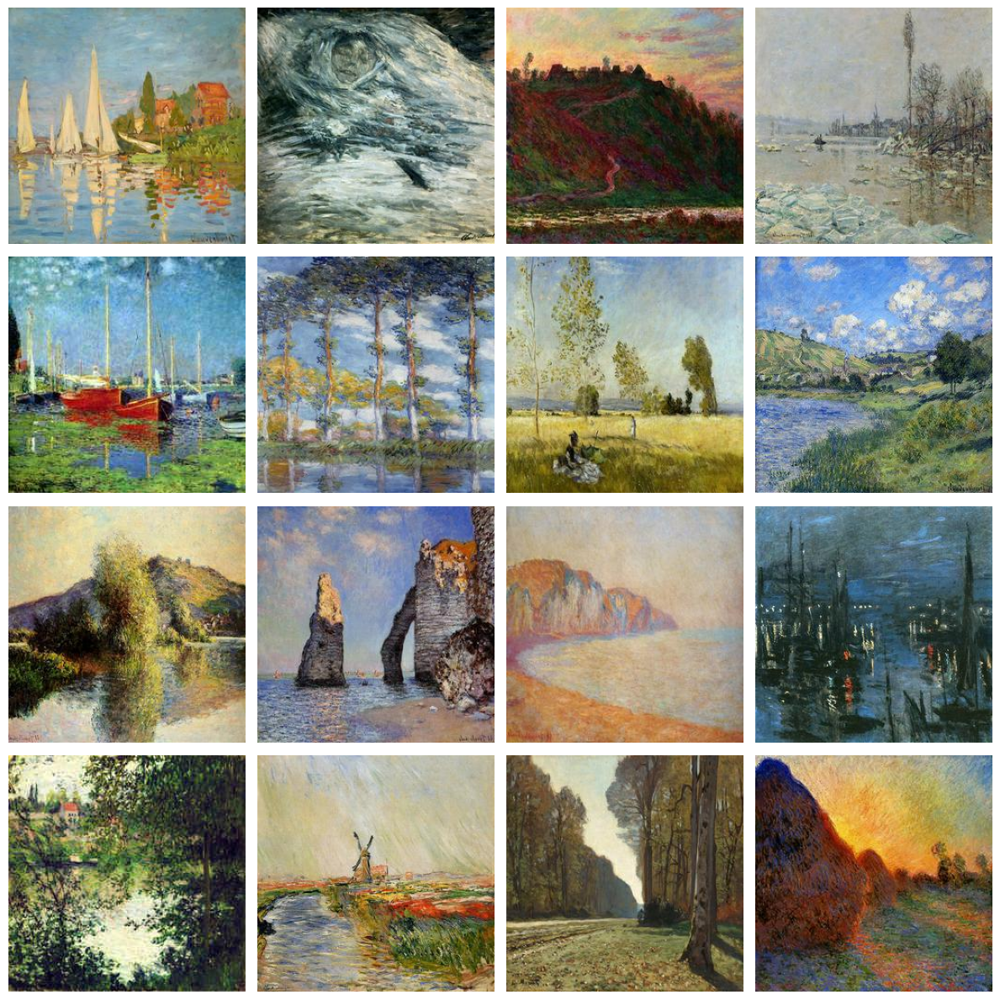

In [4]:
display_images_in_grid(path_monet)

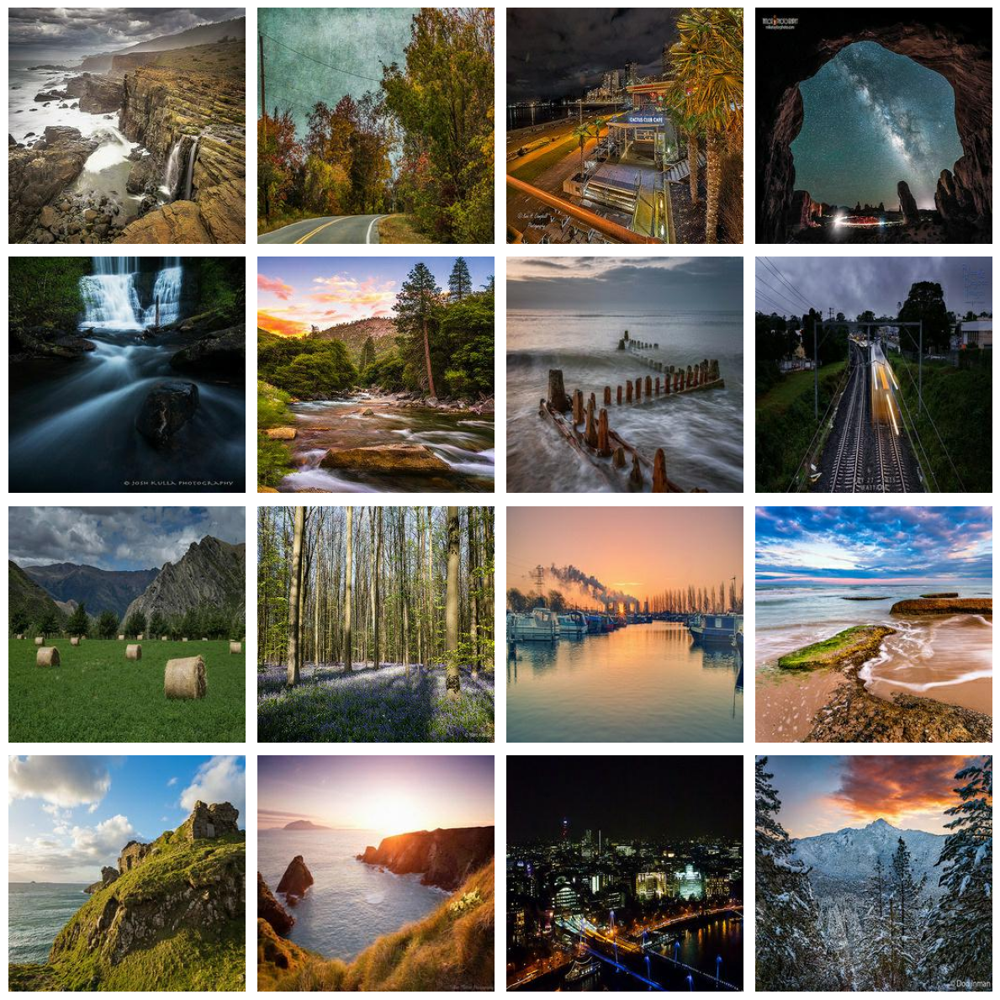

In [5]:
display_images_in_grid(path_photo)

In [6]:
def plot_rgb_histograms(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title('Original Image')
    
    plt.subplot(1, 2, 2)
    colors = ['red', 'green', 'blue']
    for i, color in enumerate(colors):
        plt.hist(
            img[:, :, i].ravel(), 
            bins=256, 
            color=color,
            alpha=0.5,
            label=f'{color.capitalize()} Channel'
        )
    
    plt.title('Color Channel Histogram')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Density')
    plt.xlim(0, 255)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

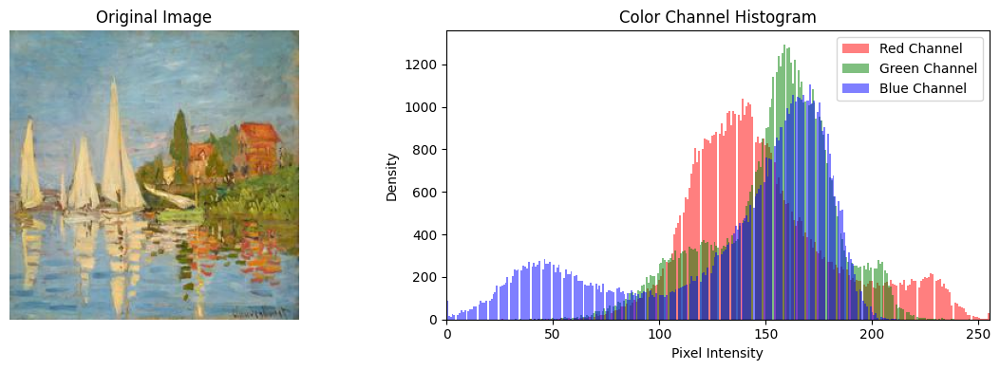

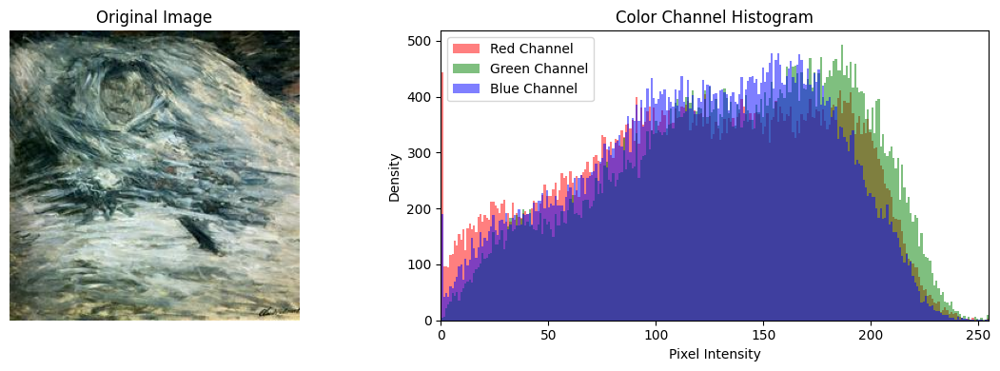

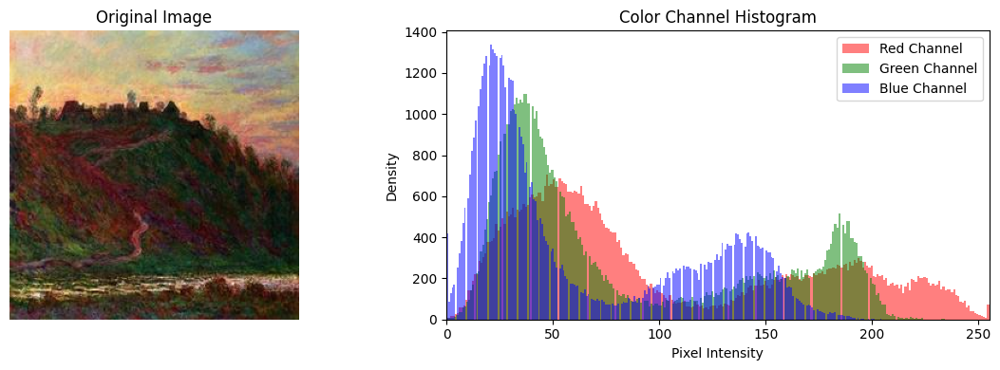

In [7]:
#monet pictures
plot_rgb_histograms(path_monet + os.listdir(path_monet)[0])
plot_rgb_histograms(path_monet + os.listdir(path_monet)[1])
plot_rgb_histograms(path_monet + os.listdir(path_monet)[2])

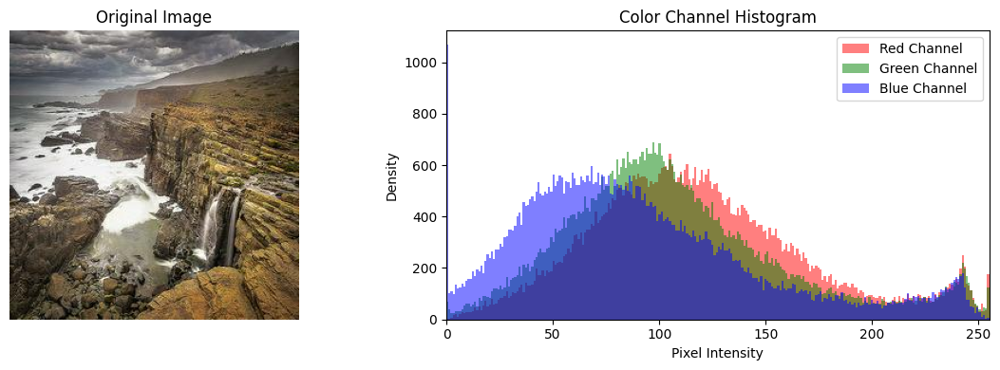

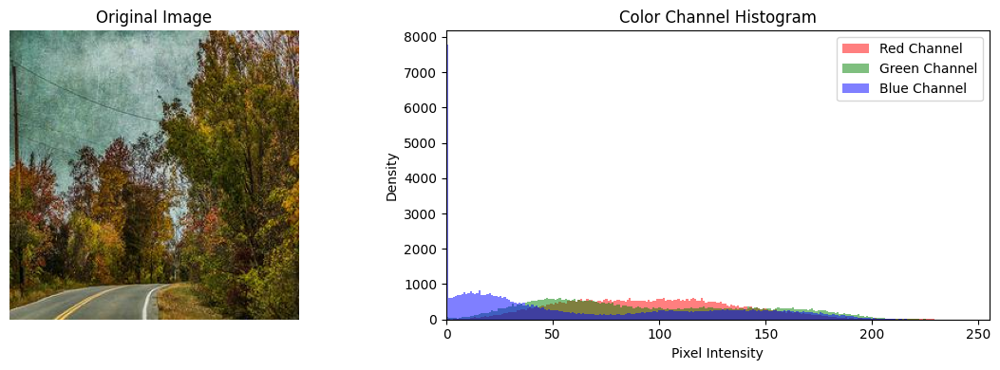

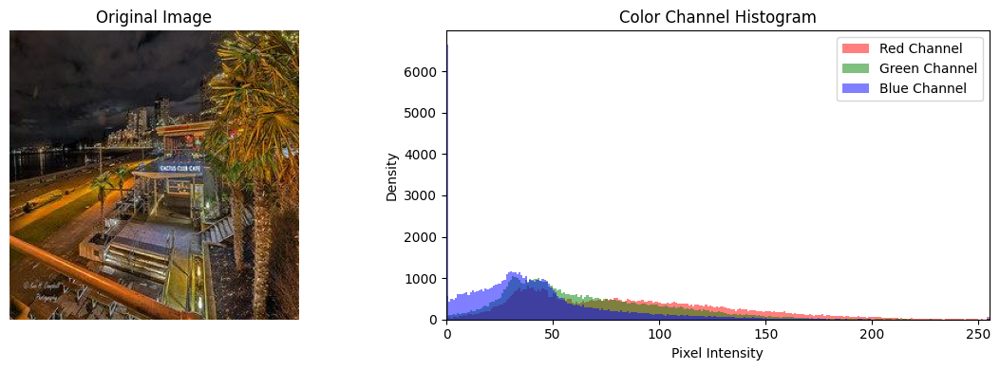

In [8]:
#sample pictures
plot_rgb_histograms(path_photo + os.listdir(path_photo)[0])
plot_rgb_histograms(path_photo + os.listdir(path_photo)[1])
plot_rgb_histograms(path_photo + os.listdir(path_photo)[2])

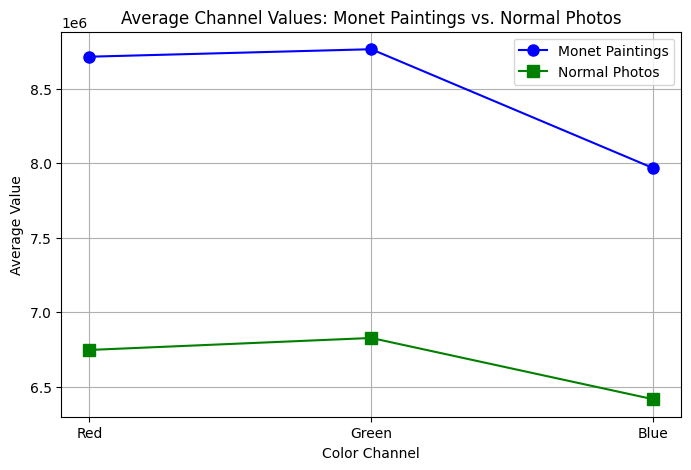

In [9]:
def compute_channel_averages(image_directory):
    # Initialize sum for each channel (R, G, B) and image count
    total_sum = np.zeros(3)
    count = 0

    # Iterate over each image file in the directory
    for filename in os.listdir(image_directory):
        image_path = os.path.join(image_directory, filename)
        image = Image.open(image_path)
        image_array = np.array(image)

        # Check if image is exactly 256x256 pixels and has 3 channels (color image)
        if image_array.shape == (256, 256, 3):
            total_sum += np.sum(image_array, axis=(0, 1))
            count += 1

    # Calculate average values for each channel
    return total_sum / count if count else np.zeros(3)

# Manually calculate average channel values for Monet paintings
monet_dir = path_monet
monet_total = np.zeros(3)
monet_count = 0

for file in os.listdir(monet_dir):
    img = Image.open(os.path.join(monet_dir, file))
    img_array = np.array(img)
    if img_array.shape == (256, 256, 3):
        monet_total += np.sum(img_array, axis=(0, 1))
        monet_count += 1

average_monet_values = monet_total / monet_count if monet_count else np.zeros(3)

# Manually calculate average channel values for normal photos
photo_dir = path_photo
photo_total = np.zeros(3)
photo_count = 0

for file in os.listdir(photo_dir):
    img = Image.open(os.path.join(photo_dir, file))
    img_array = np.array(img)
    if img_array.shape == (256, 256, 3):
        photo_total += np.sum(img_array, axis=(0, 1))
        photo_count += 1

average_photos_values = photo_total / photo_count if photo_count else np.zeros(3)

channels = ['Red', 'Green', 'Blue']
x = np.arange(len(channels))

plt.figure(figsize=(8, 5))
plt.plot(x, average_monet_values, marker='o', linestyle='-', color='b', label='Monet Paintings', markersize=8)
plt.plot(x, average_photos_values, marker='s', linestyle='-', color='g', label='Normal Photos', markersize=8)

plt.xlabel('Color Channel')
plt.ylabel('Average Value')
plt.title('Average Channel Values: Monet Paintings vs. Normal Photos')
plt.xticks(x, channels)
plt.legend()
plt.grid(True)
plt.show()

In [10]:
device = 'cpu'

In [11]:
class ImageDataset(Dataset):
    def __init__(self, path_monet, path_photo, size=(256, 256), normalize=True):
        super().__init__()
        self.monet_files = self._load_files(path_monet)
        self.photo_files = self._load_files(path_photo)
        self.transform = self._load_transform(size, normalize)

    def _load_files(self, directory):
        """Load and return a list of file paths from a directory."""
        return [os.path.join(directory, f) for f in os.listdir(directory) if f.lower().endswith(('png', 'jpg', 'jpeg'))]

    def _load_transform(self, size, normalize):
        """Create the transformation pipeline for the images."""
        transformations = [transforms.Resize(size), transforms.ToTensor()]
        if normalize:
            transformations.append(transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)))
        return transforms.Compose(transformations)

    def __getitem__(self, idx):
        """Retrieve a random pair of images, one Monet painting and one photo."""
        monet_path = self.monet_files[idx % len(self.monet_files)]  # Safe index wrapping
        photo_path = np.random.choice(self.photo_files)
        
        monet_img = self.transform(Image.open(monet_path))
        photo_img = self.transform(Image.open(photo_path))
        
        return photo_img, monet_img

    def __len__(self):
        """Return the number of Monet paintings, assuming we always have more photos."""
        return len(self.monet_files)

In [12]:
img_ds = ImageDataset(path_monet, path_photo)
img_dl = DataLoader(img_ds, batch_size=1, pin_memory=True)

In [13]:
def reverse_normalize(img, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]):
    mean = torch.tensor(mean, dtype=img.dtype, device=img.device)
    std = torch.tensor(std, dtype=img.dtype, device=img.device)
    
    # Perform the reverse normalization
    img = img * std[:, None, None] + mean[:, None, None]
        
    return img

In [14]:
def Upsample(in_channels, out_channels, use_dropout=True, dropout_ratio=0.5):
    """
    Creates an upsampling block for neural networks.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
        use_dropout (bool): Whether to use dropout in the upsampling block.
        dropout_ratio (float): Dropout ratio if dropout is used.

    Returns:
        nn.Sequential: The upsampling block.
    """
    layers = [
        nn.ConvTranspose2d(in_channels, out_channels, 3, stride=2, padding=1, output_padding=1),
        nn.InstanceNorm2d(out_channels),
        nn.GELU()
    ]
    
    if use_dropout:
        # Insert dropout before the activation function (GELU)
        layers.insert(2, nn.Dropout(dropout_ratio))
    
    return nn.Sequential(*layers)

# Example of using the Upsample function:
# upsample_block = Upsample(in_ch=64, out_ch=128, use_dropout=False)


In [15]:
def ConvLayer(in_channels, out_channels, kernel_size=3, stride=2, use_leaky=True, use_inst_norm=True, use_pad=True):
    """
    Constructs a convolutional layer with configurable options for activation and normalization.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
        kernel_size (int): Size of the convolution kernel.
        stride (int): Stride of the convolution.
        use_leaky (bool): If True, use LeakyReLU activation, otherwise use GELU.
        use_inst_norm (bool): If True, use instance normalization, otherwise use batch normalization.
        use_pad (bool): If True, apply padding to keep dimensions consistent, otherwise no padding.

    Returns:
        nn.Sequential: The constructed convolutional layer.
    """
    padding = kernel_size // 2 if use_pad else 0

    # Define the convolution layer
    conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=True)

    # Select the normalization layer
    norm = nn.InstanceNorm2d(out_channels) if use_inst_norm else nn.BatchNorm2d(out_channels)

    # Select the activation function
    activation = nn.LeakyReLU(negative_slope=0.2, inplace=True) if use_leaky else nn.GELU()

    return nn.Sequential(conv, norm, activation)

# Example of using the ConvLayer function:
# conv_layer = ConvLayer(in_channels=32, out_channels=64, use_leaky=False, use_pad=False)


In [16]:
class ResBlock(nn.Module):
    def __init__(self, in_features, use_dropout=True, dropout_ratio=0.5):
        """
        Initializes the Residual Block used in the generator.

        Args:
            in_features (int): Number of input and output channels.
            use_dropout (bool): Whether to include dropout layers.
            dropout_ratio (float): Dropout ratio if dropout is used.
        """
        super(ResBlock, self).__init__()
        
        # List to hold all the layers in this block
        layers = [
            nn.ReflectionPad2d(1),
            ConvLayer(in_features, in_features, kernel_size=3, stride=1, use_leaky=False, use_pad=False, use_inst_norm=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3, 1, padding=0, bias=True),
            nn.InstanceNorm2d(in_features)
        ]

        # Conditionally add dropout to the layers
        if use_dropout:
            layers.insert(2, nn.Dropout(dropout_ratio))

        self.res = nn.Sequential(*layers)

    def forward(self, x):
        """
        Defines the forward pass for the Residual Block.

        Args:
            x (Tensor): Input tensor to the residual block.

        Returns:
            Tensor: Output tensor after adding the input to the block's output.
        """
        return x + self.res(x)

# Example usage:
# res_block = ResBlock(in_features=64, use_dropout=True, dropout_ratio=0.5)


In [17]:
class Generator(nn.Module):
    def __init__(self, in_channels, out_channels, num_res_blocks=6):
        """
        Initializes the Generator with convolutional and residual blocks.

        Args:
            in_channels (int): Number of channels in the input image.
            out_channels (int): Number of channels in the output image.
            num_res_blocks (int): Number of residual blocks to use.
        """
        super(Generator, self).__init__()

        # Initial convolution block with a larger kernel size
        initial_layers = [
            nn.ReflectionPad2d(3),
            ConvLayer(in_channels, 64, kernel_size=7, stride=1, use_leaky=False, use_pad=False, use_inst_norm=True)
        ]

        # Downsampling
        downsampling_layers = [
            ConvLayer(64, 128, kernel_size=3, stride=2, use_leaky=False),
            ConvLayer(128, 256, kernel_size=3, stride=2, use_leaky=False)
        ]

        # Residual blocks
        res_blocks = [ResBlock(256) for _ in range(num_res_blocks)]

        # Upsampling
        upsampling_layers = [
            Upsample(256, 128),
            Upsample(128, 64)
        ]

        # Output layer
        output_layers = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, out_channels, kernel_size=7, padding=0),
            nn.Tanh()
        ]

        # Combine all parts of the generator into a single sequence
        self.gen = nn.Sequential(
            *(initial_layers + downsampling_layers + res_blocks + upsampling_layers + output_layers)
        )

    def forward(self, x):
        """
        Defines the forward pass of the generator.

        Args:
            x (Tensor): Input tensor to the generator.

        Returns:
            Tensor: Output tensor from the generator.
        """
        return self.gen(x)

# Example of using the Generator:
# generator = Generator(in_channels=3, out_channels=3, num_res_blocks=6)


In [18]:
class Discriminator(nn.Module):
    def __init__(self, in_channels, num_layers=4):
        """
        Initializes the Discriminator with convolutional layers and LeakyReLU activation.

        Args:
            in_channels (int): Number of channels in the input image.
            num_layers (int): Number of convolutional layers in the discriminator.
        """
        super(Discriminator, self).__init__()

        # Initialize the list of layers
        layers = [
            # Initial convolution layer with a simpler structure
            nn.Conv2d(in_channels, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        # Dynamically create the convolutional layers based on num_layers
        for i in range(1, num_layers):
            in_chs = 64 * (2 ** (i - 1))
            out_chs = in_chs * 2
            stride = 1 if i == num_layers - 1 else 2
            layers.append(ConvLayer(in_chs, out_chs, kernel_size=4, stride=stride, use_leaky=True))

        # Final convolution layer to produce a single output per patch
        layers.append(nn.Conv2d(out_chs, 1, kernel_size=4, stride=1, padding=1))

        # Register the layers as a sequential model
        self.disc = nn.Sequential(*layers)

    def forward(self, x):
        """
        Defines the forward pass of the discriminator.

        Args:
            x (Tensor): Input tensor to the discriminator.

        Returns:
            Tensor: Output tensor from the discriminator.
        """
        return self.disc(x)

# Example of using the Discriminator:
# discriminator = Discriminator(in_channels=3, num_layers=4)


In [19]:
def init_weights(net, init_type='normal', init_gain=0.02):
    """
    Initialize network weights.
    
    Args:
        net (nn.Module): Network to initialize.
        init_type (str): The name of an initialization method: 'normal' or 'xavier'.
        init_gain (float): Standard deviation of the normal distribution for weight initialization.

    """
    def init_func(m):
        classname = m.__class__.__name__
        # Apply initialization to convolutional and linear layers
        if hasattr(m, 'weight') and ('Conv' in classname or 'Linear' in classname):
            if init_type == 'normal':
                init.normal_(m.weight.data, 0.0, init_gain)
            elif init_type == 'xavier':
                init.xavier_normal_(m.weight.data, gain=init_gain)
                
            if hasattr(m, 'bias') and m.bias is not None:
                init.constant_(m.bias.data, 0.0)

        # Initialization for BatchNorm2d layers
        elif 'BatchNorm2d' in classname:
            init.normal_(m.weight.data, 1.0, init_gain)
            init.constant_(m.bias.data, 0.0)

    net.apply(init_func)

# Example of using init_weights:
# model = Generator(3, 3)
# init_weights(model, 'normal', 0.02)

In [20]:
def update_req_grad(models, trainable=True):
    """
    Sets the 'requires_grad' property for all parameters in given models.
    
    Args:
        models (list of nn.Module): A list of PyTorch models whose parameters will be updated.
        trainable (bool): If True, the model's parameters will require gradients, otherwise they won't.
    """
    for model in models:
        for param in model.parameters():
            param.requires_grad = trainable

# Example usage:
# set_trainable([model1, model2], trainable=False)


In [21]:
import numpy as np

class sample_fake:
    def __init__(self, max_images=50):
        """
        Initializes the SampleFake object.

        Args:
            max_images (int): Maximum number of images to store.
        """
        self.max_images = max_images
        self.current_image_index = 0
        self.images = []

    def __call__(self, images):
        """
        Samples fake images and updates the stored images.

        Args:
            images (list of numpy.ndarray): List of generated fake images.

        Returns:
            list of numpy.ndarray: Sampled fake images.
        """
        sampled_images = []
        for image in images:
            if self.current_image_index < self.max_images:
                self.images.append(image)
                sampled_images.append(image)
                self.current_image_index += 1
            else:
                if np.random.rand() > 0.5:
                    index = np.random.randint(0, self.max_images)
                    sampled_images.append(self.images[index])
                    self.images[index] = image
                else:
                    sampled_images.append(image)
        return sampled_images

# Example usage:
# sample_fake = SampleFake(max_images=50)
# sampled_images = sample_fake(fake_images)


In [22]:
class lr_sched:
    def __init__(self, decay_start_epoch=100, total_epochs=200):
        """
        Initializes a learning rate scheduler with a linear decay after a specified start.

        Args:
            decay_start_epoch (int): Epoch from which the learning rate starts to decay.
            total_epochs (int): Total number of epochs after which the learning rate will reach zero.
        """
        self.decay_start_epoch = decay_start_epoch
        self.total_epochs = total_epochs

    def step(self, current_epoch):
        """
        Calculates the learning rate based on the current epoch.

        Args:
            current_epoch (int): The current epoch number.

        Returns:
            float: The scaled learning rate.
        """
        if current_epoch <= self.decay_start_epoch:
            return 1.0
        else:
            # Calculate the fraction of the decay period completed
            decay_progress = (current_epoch - self.decay_start_epoch) / (self.total_epochs - self.decay_start_epoch)
            return 1.0 - decay_progress

# Example of using the LearningRateScheduler:
# lr_scheduler = LearningRateScheduler(decay_start_epoch=100, total_epochs=200)
# current_lr = lr_scheduler.get_lr(current_epoch=150)


In [23]:
class AvgStats(object):
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.losses =[]
        self.its = []
        
    def append(self, loss, it):
        self.losses.append(loss)
        self.its.append(it)

In [24]:
# defines the Cycle GAN and its training loop
class CycleGAN(object):
    def __init__(self, in_ch, out_ch, epochs, device, start_lr=2e-4, lmbda=10, idt_coef=0.5, decay_epoch=0):
        self.epochs = epochs
        self.decay_epoch = decay_epoch if decay_epoch > 0 else int(self.epochs/2)
        self.lmbda = lmbda
        self.idt_coef = idt_coef
        self.device = device
        self.gen_mtp = Generator(in_ch, out_ch)
        self.gen_ptm = Generator(in_ch, out_ch)
        self.desc_m = Discriminator(in_ch)
        self.desc_p = Discriminator(in_ch)
        self.init_models()
        self.mse_loss = nn.MSELoss()
        self.l1_loss = nn.L1Loss()
        self.adam_gen = torch.optim.Adam(itertools.chain(self.gen_mtp.parameters(), self.gen_ptm.parameters()),
                                         lr = start_lr, betas=(0.5, 0.999))
        self.adam_desc = torch.optim.Adam(itertools.chain(self.desc_m.parameters(), self.desc_p.parameters()),
                                          lr=start_lr, betas=(0.5, 0.999))
        self.sample_monet = sample_fake()
        self.sample_photo = sample_fake()
        gen_lr = lr_sched(self.decay_epoch, self.epochs)
        desc_lr = lr_sched(self.decay_epoch, self.epochs)
        self.gen_lr_sched = torch.optim.lr_scheduler.LambdaLR(self.adam_gen, gen_lr.step)
        self.desc_lr_sched = torch.optim.lr_scheduler.LambdaLR(self.adam_desc, desc_lr.step)
        self.gen_stats = AvgStats()
        self.desc_stats = AvgStats()
        
    def init_models(self):
        init_weights(self.gen_mtp)
        init_weights(self.gen_ptm)
        init_weights(self.desc_m)
        init_weights(self.desc_p)
        self.gen_mtp = self.gen_mtp.to(self.device)
        self.gen_ptm = self.gen_ptm.to(self.device)
        self.desc_m = self.desc_m.to(self.device)
        self.desc_p = self.desc_p.to(self.device)
        
    def train(self, photo_dl):
        for epoch in range(self.epochs):
            start_time = time.time()
            avg_gen_loss, avg_desc_loss = self.train_one_epoch(photo_dl, epoch)
            self.log_training(epoch, avg_gen_loss, avg_desc_loss, start_time)

    def train_one_epoch(self, photo_dl, epoch):
        avg_gen_loss = 0.0
        avg_desc_loss = 0.0
        t = tqdm(photo_dl, leave=False, total=len(photo_dl))

        for photo_real, monet_real in t:
            photo_real, monet_real = photo_real.to(self.device), monet_real.to(self.device)
            gen_loss, desc_loss = self.process_batch(photo_real, monet_real)
            avg_gen_loss += gen_loss
            avg_desc_loss += desc_loss
            t.set_postfix(gen_loss=gen_loss, desc_loss=desc_loss)

        return avg_gen_loss / len(photo_dl), avg_desc_loss / len(photo_dl)

    def process_batch(self, photo_real, monet_real):
        gen_loss = self.update_generators(photo_real, monet_real)
        desc_loss = self.update_discriminators(photo_real, monet_real)
        return gen_loss.item(), desc_loss.item()

    def update_generators(self, photo_real, monet_real):
        self.adam_gen.zero_grad()
        
        # Generate fake images
        fake_photo = self.gen_mtp(monet_real)
        fake_monet = self.gen_ptm(photo_real)
    
        # Cycle consistency
        cycl_monet = self.gen_ptm(fake_photo)
        cycl_photo = self.gen_mtp(fake_monet)
    
        # Identity mapping
        id_monet = self.gen_ptm(monet_real)
        id_photo = self.gen_mtp(photo_real)
    
        # Generator losses
        idt_loss_monet = self.l1_loss(id_monet, monet_real) * self.lmbda * self.idt_coef
        idt_loss_photo = self.l1_loss(id_photo, photo_real) * self.lmbda * self.idt_coef
    
        cycle_loss_monet = self.l1_loss(cycl_monet, monet_real) * self.lmbda
        cycle_loss_photo = self.l1_loss(cycl_photo, photo_real) * self.lmbda
    
        # Adversarial losses (Discriminators should think the fakes are real)
        real_label = torch.ones_like(self.desc_m(fake_monet), device=self.device)
        adv_loss_monet = self.mse_loss(self.desc_m(fake_monet), real_label)
        adv_loss_photo = self.mse_loss(self.desc_p(fake_photo), real_label)
    
        # Total generator loss
        total_gen_loss = cycle_loss_monet + adv_loss_monet + cycle_loss_photo + adv_loss_photo + idt_loss_monet + idt_loss_photo
        total_gen_loss.backward()
        self.adam_gen.step()
    
        return total_gen_loss

    def update_discriminators(self, photo_real, monet_real):
        update_req_grad([self.desc_m, self.desc_p], True)
        self.adam_desc.zero_grad()
    
        # Generate fake images (detach to stop gradients to generators)
        fake_photo = self.gen_mtp(monet_real).detach()
        fake_monet = self.gen_ptm(photo_real).detach()
    
        # Discriminator losses
        real_label = torch.ones_like(self.desc_m(monet_real), device=self.device)
        fake_label = torch.zeros_like(self.desc_m(fake_monet), device=self.device)
    
        # Real images should be classified as real
        monet_desc_real_loss = self.mse_loss(self.desc_m(monet_real), real_label)
        photo_desc_real_loss = self.mse_loss(self.desc_p(photo_real), real_label)
    
        # Fake images should be classified as fake
        monet_desc_fake_loss = self.mse_loss(self.desc_m(fake_monet), fake_label)
        photo_desc_fake_loss = self.mse_loss(self.desc_p(fake_photo), fake_label)
    
        # Total discriminator loss
        total_desc_loss = (monet_desc_real_loss + monet_desc_fake_loss + photo_desc_real_loss + photo_desc_fake_loss) / 4
        total_desc_loss.backward()
        self.adam_desc.step()
    
        return total_desc_loss

    def log_training(self, epoch, avg_gen_loss, avg_desc_loss, start_time):
        self.gen_lr_sched.step()
        self.desc_lr_sched.step()
        time_elapsed = time.time() - start_time
        self.gen_stats.append(avg_gen_loss, time_elapsed)
        self.desc_stats.append(avg_desc_loss, time_elapsed)

In [30]:
gan = CycleGAN(3, 3, 10, device)
gan.train(img_dl)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

In [31]:
# plot losses
def plot_gan_loss():
    plt.xlabel("Epochs")
    plt.ylabel("Losses")
    plt.plot(gan.gen_stats.losses, 'r', label='Generator Loss')
    plt.plot(gan.desc_stats.losses, 'b', label='Descriminator Loss')
    plt.legend()
    plt.show()

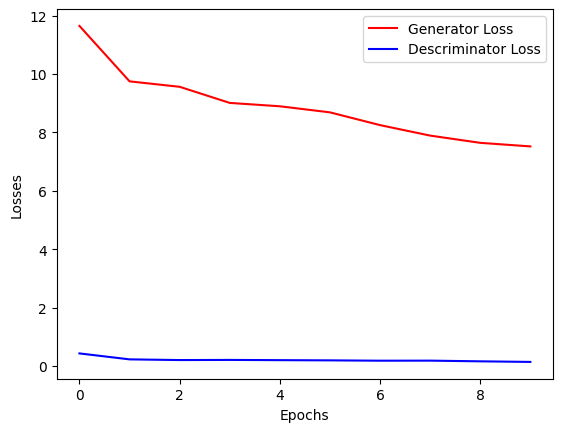

In [32]:
plot_gan_loss()

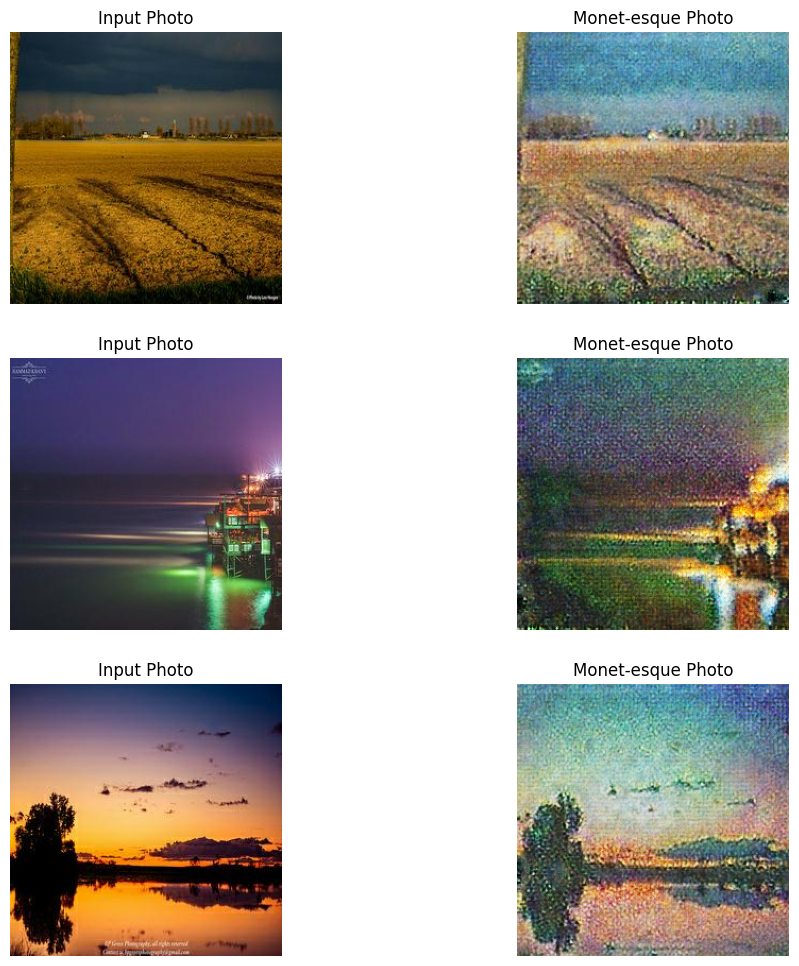

In [33]:
# plot realistic photo and created monet-style image 
_, ax = plt.subplots(3, 2, figsize=(12, 12))
for i in range(3):
    photo_img, _ = next(iter(img_dl))
    pred_monet = gan.gen_ptm(photo_img.to(device)).cpu().detach()
    photo_img = reverse_normalize(photo_img)
    pred_monet = reverse_normalize(pred_monet)
    
    ax[i, 0].imshow(photo_img[0].permute(1, 2, 0))
    ax[i, 1].imshow(pred_monet[0].permute(1, 2, 0))
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque Photo")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

In [34]:
# class to store and access the photos (similar to the paintings done before)
class PhotoDataset(Dataset):
    def __init__(self, photo_dir, size=(256, 256), normalize=True):
        super().__init__()
        self.photo_dir = photo_dir
        self.photo_idx = dict()
        
        # normalize images if needed
        if normalize:
            self.transform = transforms.Compose([
                transforms.Resize(size),
                transforms.ToTensor(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))                                
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize(size),
                transforms.ToTensor()                               
            ])
        for i, fl in enumerate(os.listdir(self.photo_dir)):
            self.photo_idx[i] = fl

    # retrieve an image
    def __getitem__(self, idx):
        photo_path = os.path.join(self.photo_dir, self.photo_idx[idx])
        photo_img = Image.open(photo_path)
        photo_img = self.transform(photo_img)
        return photo_img

    def __len__(self):
        return len(self.photo_idx.keys())

In [35]:
# make a dataloader and the required directory for storing the images to be created
ph_ds = PhotoDataset(path_photo)
ph_dl = DataLoader(ph_ds, batch_size=1, pin_memory=True)
trans = transforms.ToPILImage()

In [ ]:
# use model to create a monet style image
t = tqdm(ph_dl, leave=False, total=ph_dl.__len__())
for i, photo in enumerate(t):
    with torch.no_grad():
        pred_monet = gan.gen_ptm(photo.to(device)).cpu().detach()
    
    # revert the normalization process to obtain the original image style
    pred_monet = reverse_normalize(pred_monet)
    img = trans(pred_monet[0]).convert("RGB")
    
    # store the image
    img.save("images/" + str(i+1) + ".jpg")

  0%|          | 0/7038 [00:00<?, ?it/s]

In [ ]:
# create a zip file from all created images
shutil.make_archive("/working/images", 'zip', "/images")

In [ ]:
display_sample_images("images/")

In [ ]:
# display best hyperparameters of model
learning_rate = [2e-4]
beta_1 = [0.5]
beta_2 = [0.999]  
df_results = pd.DataFrame({'Learning Rate': learning_rate, 'Beta 1': beta_1, 'Beta 2': beta_2})
print(df_results)